In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def plot_image(image: np.ndarray, title: str, ax: plt.Axes = None) -> None:
    if ax is None:
        fig, ax = plt.subplots()
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis('off')

In [3]:
def detect_and_highlight_lines(image, accept_threshold = 150, reject_threshold = 50, threshold = 100,
                               aperture_size = 3, rho_resolution = 1.0, theta_resolution = np.pi/180) :
    image = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.ndim == 3 else image
    edges = cv2.Canny(
        gray,
        threshold1=reject_threshold,
        threshold2=accept_threshold,
        apertureSize=aperture_size,
        L2gradient=True  
    )
    lines = cv2.HoughLinesP(
        edges,
        rho=rho_resolution,
        theta=theta_resolution,
        threshold=threshold,
        maxLineGap=20000
    )

    if lines is not None:
        for ends in lines[:, 0]:
            cv2.line(image, tuple(ends[:2]), tuple(ends[2:]), (0, 0, 255), 1)
    else:
        print("No lines found")

    return image, lines

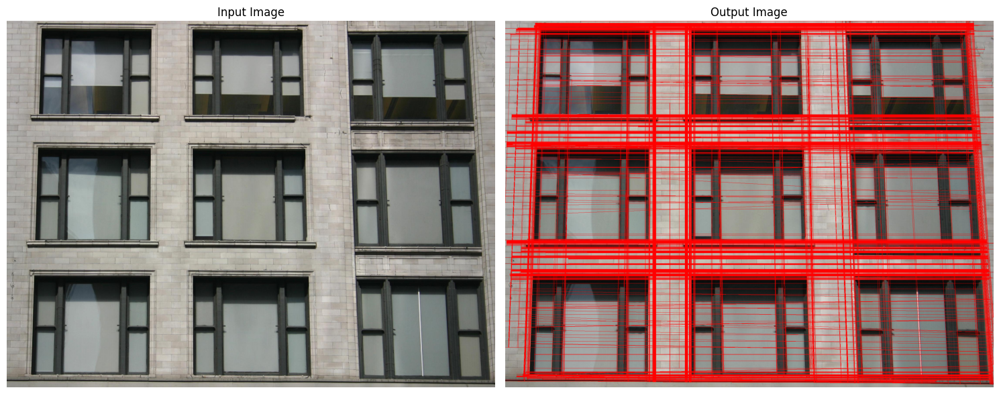

In [4]:
DATA_DIR = '../images/'
img_path = DATA_DIR + 'chicago-window.jpg'

input_image = cv2.imread(img_path)
output_image, _ = detect_and_highlight_lines(input_image)

_, axs = plt.subplots(1, 2, figsize=(15, 8))
plot_image(input_image, title="Input Image", ax=axs[0])
plot_image(output_image, title="Output Image", ax=axs[1])
plt.tight_layout()
plt.show()

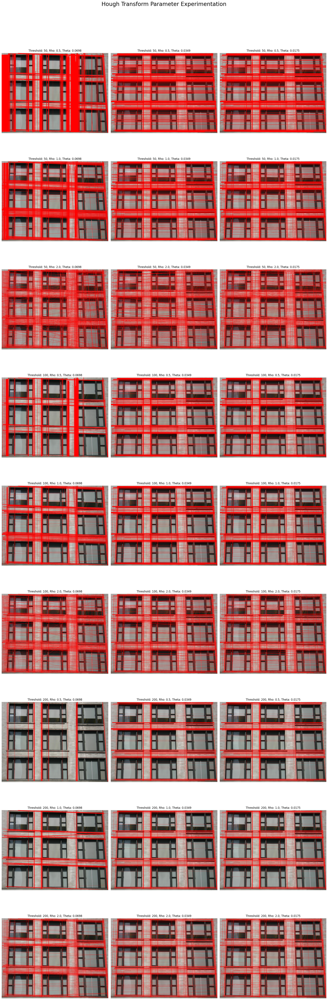

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns

def ht_exp(image):
    thresholds = [50, 100, 200]
    rho_resolutions = [0.5, 1.0, 2.0]
    theta_resolutions = [np.pi/45, np.pi/90, np.pi/180]
    
    results = []
    
    num_cols = 3  # Only three images per row
    num_rows = (len(thresholds) * len(rho_resolutions) * len(theta_resolutions)) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 7))
    fig.suptitle('Hough Transform Parameter Experimentation', fontsize=24)
    
    axes = axes.flatten()  # Flatten axes array for easy indexing
    
    for idx, (threshold, rho_resolution, theta_resolution) in enumerate(
            [(t, r, th) for t in thresholds for r in rho_resolutions for th in theta_resolutions]):
        
        processed_img, lines = detect_and_highlight_lines(
            image, 
            threshold=threshold,
            rho_resolution=rho_resolution,
            theta_resolution=theta_resolution
        )
        num_lines = len(lines) if lines is not None else 0

        results.append({
            'Threshold': threshold,
            'Rho Resolution': rho_resolution,
            'Theta Resolution': theta_resolution,
            'Number of Lines': num_lines
        })
        
        ax = axes[idx]
        ax.imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
        ax.set_title(f'Threshold: {threshold}, Rho: {rho_resolution}, Theta: {theta_resolution:.4f}', fontsize=12)
        ax.axis('off')
    
    # Hide any unused axes
    for ax in axes[len(results):]:
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)  # Adjust top spacing to fit the suptitle
    plt.show()
    return None

ht_exp(input_image)

## Impact of parameters:

---

### Threshold Parameter

#### Low threshold:

- Detects more lines
- Increases false positives
- Captures weaker/less distinct lines

### High threshold:

- Detects fewer, more confident lines
- Reduces noise and false detections
- Requires more distinct line edges

---

### Rho (ρ) Resolution Parameter

#### Small resolution (0.5):

- Higher precision in line distance measurement
- More granular line detection
- Captures subtle line positions

#### Large resolution (2.0):

- Broader line distance measurement
- Merges nearby lines
- Reduces computational complexity
- Less precise line localization

---

### Theta (θ) Resolution Parameter

#### Small angle resolution:

- Captures more line orientations
- Higher angular precision
- Detects subtle line angles
- More computational intensive

#### Large angle resolution:

- Fewer detected line orientations
- Less computational load
- Misses subtle line variations